In [31]:
library('dplyr')
library('stm')
library('tibble')
library('tidyverse')

── Attaching packages ─────────────────────────────────────── tidyverse 1.2.1 ──
✔ ggplot2 3.1.1     ✔ purrr   0.3.2
✔ tidyr   0.8.3     ✔ stringr 1.4.0
✔ readr   1.3.1     ✔ forcats 0.4.0
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


In [1]:
setwd('../../swarm/data/')
getwd()

[1] "/home/jovyan/work/swarm/data"

### Read data, describe demographics

In [49]:
data = read.csv('charters_cleaned_filtered.csv')

In [48]:
data%>%
select("ncessch","white_students","black_students","asian_students","hispanic_students","mixed_students","native_students")%>%
group_by(ncessch)%>%
gather("race","prop",2:7)->temp
#head(temp)

# Show means per racial category
temp%>%select(-"ncessch")%>%group_by(race)%>%summarise(mean(prop,na.rm=TRUE))

# Show medians per racial category
temp%>%select(-"ncessch")%>%group_by(race)%>%summarise(median(prop,na.rm=TRUE))

Adding missing grouping variables: `ncessch`


race,"mean(prop, na.rm = TRUE)"
<chr>,<dbl>
asian_students,0.03758574
black_students,0.25805811
hispanic_students,0.30359517
mixed_students,0.03586074
native_students,0.01415927
white_students,0.35130814


Adding missing grouping variables: `ncessch`


race,"median(prop, na.rm = TRUE)"
<chr>,<dbl>
asian_students,0.01204819
black_students,0.09278816
hispanic_students,0.18010368
mixed_students,0.02400000
native_students,0.00210085
white_students,0.26789986


### 1. Ingest: Reading and processing text data

In [50]:
# drop NA/Null

# data[complete.cases(data), ]
data = na.omit(data)

In [51]:
# get random 1000 rows from dataframe 
# data[sample(nrow(df), 1000), ]
data = sample_n(data, 1000)

In [52]:
# check whether rows contain any NAs
row.has.na <- apply(data, 1, function(x){any(is.na(x))})
sum(row.has.na)

[1] 0

In [53]:
dim(data)

[1] 1000   60

In [54]:
str(data)

'data.frame':	1000 obs. of  60 variables:
 $ master_string          : Factor w/ 5367 levels "                         parent involvement policy as required section bb esea parent involvement means partici"| __truncated__,..: 1828 3882 3300 747 2212 2644 3443 3942 5114 1961 ...
 $ inquiry_ideology       : num  0.01237 0.00712 0.0035 0.00295 0.00791 ...
 $ readingblur_2013       : num  5 10 5 5 5 1 20 5 1 1 ...
 $ mathblur_2013          : num  10 10 5 5 5 1 20 5 1 1 ...
 $ readingscore_2013      : num  87 95 67 72 82 96 70 62 58 90 ...
 $ mathscore_2013         : num  85 75 52 67 57 90 50 62 56 91 ...
 $ readingblur_2014       : num  5 10 5 5 5 1 20 5 1 1 ...
 $ mathblur_2014          : num  5 10 5 5 5 1 20 5 1 1 ...
 $ readingscore_2014      : num  42 55 62 62 57 97 50 32 51 86 ...
 $ mathscore_2014         : num  27 35 44 52 57 96 10 22 44 80 ...
 $ readingblur_2015       : num  5 5 5 5 5 1 20 5 1 1 ...
 $ mathblur_2015          : num  5 10 5 5 5 1 20 5 1 1 ...
 $ readingscore_2015    

In [55]:
as_tibble(data)

master_string                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

In [56]:
processed <- textProcessor(data$master_string, metadata = data)

Building corpus... 
Converting to Lower Case... 
Removing punctuation... 
Removing stopwords... 
Removing numbers... 
Stemming... 
Creating Output... 


In [57]:
processed

A text corpus with 1000 documents, and an 51900 word dictionary.

In [58]:
out <- prepDocuments(processed$documents, processed$vocab, processed$meta)

Removing 32650 of 51900 terms (32650 of 628522 tokens) due to frequency 
Your corpus now has 1000 documents, 19250 terms and 595872 tokens.

In [59]:
docs <- out$documents
vocab <- out$vocab
meta <- out$meta

### 2. Prepare: Associating text with metadata

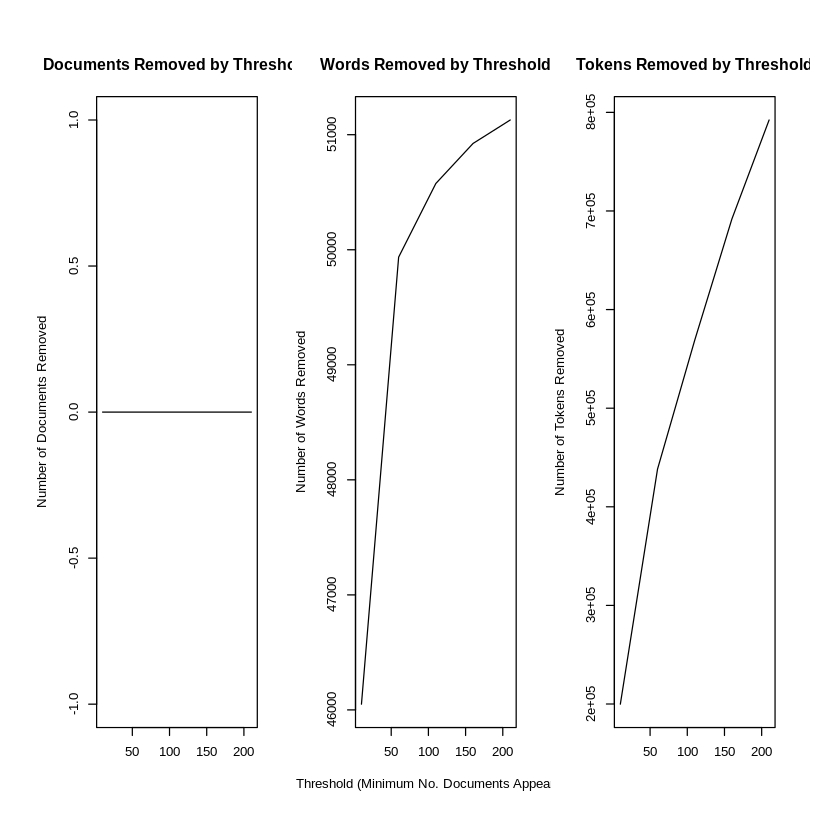

In [61]:
plotRemoved(processed$documents, lower.thresh = seq(10, 210, by = 50))

In [62]:
out <- prepDocuments(processed$documents, processed$vocab,processed$meta, lower.thresh = 20)


Removing 47987 of 51900 terms (111611 of 628522 tokens) due to frequency 
Your corpus now has 1000 documents, 3913 terms and 516911 tokens.

### 3. Estimate: Estimating the structural topic model

In [ ]:
#charterPrevFit <- stm(documents = out$documents, vocab = out$vocab,K = 20, prevalence =['poor_students', 'students_ofcolor', 'poverty_district', 'people_ofcolor_district', 'readingscore_2015', 'mathscore_2015', 'primary', 'middle', 'high', 'lnage', 'lnstudents', 'urban', 'pctpdfs', 'numwords', 'readingblur_2015', 'mathblur_2015', 'lnteachers'], max.em.its = 25, data = out$meta, init.type = "Spectral")

In [32]:
# Estimating the structural topic model

charterPrevFit <- stm(documents = out$documents, vocab = out$vocab,K = 20, prevalence =~ white_students,max.em.its = 25, data = out$meta, init.type = "Spectral")

Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	....................
	 Recovering initialization...
 	...........................................................................................
Initialization complete.
..............................................................................................................
Completed E-Step (6 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -7.284) 
..............................................................................................................
Completed E-Step (6 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -7.072, relative change = 2.910e-02) 
..............................................................................................................
Completed E-Step (5 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -7.010, relative change = 8.749e-03) 
..................

In [18]:
levels(meta$rating)

NULL

In [37]:
colnames(data)

[1] "master_string"           "inquiry_ideology"       
 [3] "readingblur_2013"        "mathblur_2013"          
 [5] "readingscore_2013"       "mathscore_2013"         
 [7] "readingblur_2014"        "mathblur_2014"          
 [9] "readingscore_2014"       "mathscore_2014"         
[11] "readingblur_2015"        "mathblur_2015"          
[13] "readingscore_2015"       "mathscore_2015"         
[15] "students_ofcolor"        "poor_students"          
[17] "white_students"          "black_students"         
[19] "asian_students"          "hispanic_students"      
[21] "native_students"         "mixed_students"         
[23] "pctpdfs"                 "numwords"               
[25] "numpages"                "numpdfs"                
[27] "ncessch"                 "teachers"               
[29] "lnteachers"              "people_ofcolor_district"
[31] "poverty_district"        "childpovertysd"         
[33] "collegesd"               "unemployment"           
[35] "students"                "lnstudents"             
[37] "age"                     "lnage"                  
[39] "state"                   "urban"                  
[41] "primary"                 "middle"                 
[43] "high"                    "otherlevel"             
[45] "level"                   "expulsions"             
[47] "suspensions"             "incidents"              
[49] "lawreferrals"            "lepcount"               
[51] "certcount"               "certrate"               
[53] "ethnicisolated99"        "ethnicisolated95"       
[55] "ethnicisolated90"        "ethnicisolated80"       
[57] "ethnicisolated70"        "closerate"              
[59] "publicdensity"           "charterdensity"

In [20]:
print.data.frame(head(data))

In [ ]:
# covariate: ['poor_students', 'students_ofcolor', 
#'poverty_district', 'people_ofcolor_district', 'readingscore_2015', 
# 'mathscore_2015', 'primary', 'middle', 'high', 'lnage', 'lnstudents', 'urban', 
#'pctpdfs', 'numwords', 'readingblur_2015', 'mathblur_2015', 'lnteachers']

# start small
# ['poor_students', 'students_ofcolor', 'poverty_district', 'people_ofcolor_district']

In [33]:
charterPrevFit2 <- stm(documents = out$documents, vocab = out$vocab,K = 20, prevalence =~ white_students, max.em.its = 25, data = out$meta, init.type = "Spectral")

Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	....................
	 Recovering initialization...
 	...........................................................................................
Initialization complete.
..............................................................................................................
Completed E-Step (5 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -7.284) 
..............................................................................................................
Completed E-Step (6 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -7.072, relative change = 2.910e-02) 
..............................................................................................................
Completed E-Step (5 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -7.010, relative change = 8.744e-03) 
..................

In [34]:
charterPrevFit3 <- stm(documents = out$documents, vocab = out$vocab,K = 20, prevalence =~ poor_students + s(students_ofcolor) + s(poverty_district) + s(people_ofcolor_district) + s(readingscore_2015) + s(mathscore_2015) + s(primary) + s(middle) + s(high) + s(lnage) + s(lnstudents) + s(urban) + 
s(pctpdfs) + s(numwords) + s(readingblur_2015) + s(mathblur_2015) + s(lnteachers), max.em.its = 25, data = out$meta, init.type = "Spectral")

Warning message in splines::bs(x, df, ...):
“'df' was too small; have used 3”Warning message in splines::bs(x, df, ...):
“'df' was too small; have used 3”Warning message in splines::bs(x, df, ...):
“'df' was too small; have used 3”Warning message in splines::bs(x, df, ...):
“'df' was too small; have used 3”

### 4. Evaluate: Model selection and search

In [83]:
search0 <- searchK(out$documents, out$vocab, K = 0,prevalence =~ s(white_students) + s(black_students) + s(hispanic_students) + s(asian_students), content =~ people_ofcolor_district, data = meta)

Warning message:
“Exclusivity calculation only designed for models without content covariates”

Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	

Loading required namespace: geometry


	 Initializing tSNE with PCA...
 	

ERROR: Error in loadNamespace(name): there is no package called ‘rsvd’


In [ ]:
knitr::kable(search0$results)

In [87]:
#search3 <- searchK(out$documents, out$vocab, K = c(5, 10, 15, 20, 30, 40, 50),prevalence =~ s(white_students) + s(black_students) + s(hispanic_students) + s(asian_students), content =~ white_students, data = meta)
search3 <- searchK(out$documents, out$vocab, K = c(5, 10, 20, 30, 40, 50), 
                   prevalence =~ white_students, data = meta, seed=43)

Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	.....
	 Recovering initialization...
 	.......................................
Initialization complete.
....................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -7.033) 
....................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -6.959, relative change = 1.050e-02) 
....................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -6.936, relative change = 3.375e-03) 
....................................................................................................
Completed E-St

In [88]:
knitr::kable(search3$results)



|  K|   exclus|    semcoh|   heldout| residual|     bound|    lbound| em.its|
|--:|--------:|---------:|---------:|--------:|---------:|---------:|------:|
|  5| 8.178104| -12.36055| -6.910825| 4.670120| -14126487| -14126482|     48|
| 10| 8.669690| -18.41531| -6.848385| 3.968952| -13934734| -13934718|     41|
| 20| 9.184739| -24.08602| -6.761960| 3.300016| -13733395| -13733353|     73|
| 30| 9.254266| -27.72132| -6.726534| 2.898751| -13625847| -13625773|     47|
| 40| 9.307749| -31.25434| -6.703167| 2.706754| -13530743| -13530632|     55|
| 50| 9.369799| -32.46352| -6.682145| 2.572103| -13459319| -13459171|     49|

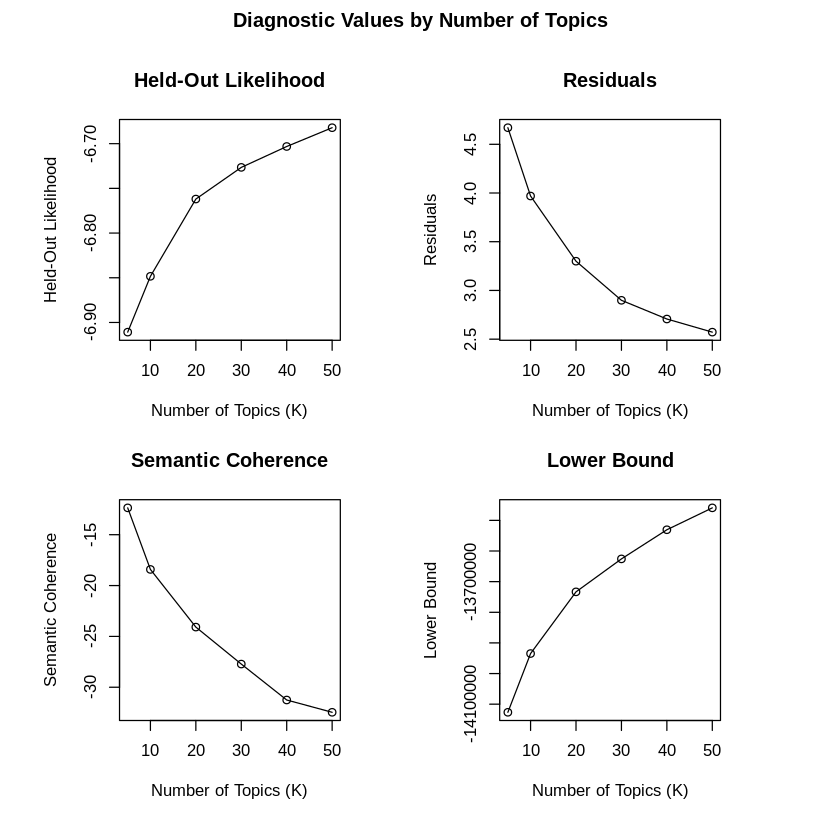

In [89]:
plot(search3)

In [ ]:
search30 <- searchK(out$documents, out$vocab, K = c(20, 22, 24, 26, 28, 30),
                    prevalence =~ white_students + s(black_students) + s(hispanic_students) + s(asian_students) + s(mixed_students), 
                    content =~ white_students, 
                    data = meta, seed=43)

Warning message:
“Exclusivity calculation only designed for models without content covariates”

In [ ]:
knitr::kable(search30$results)

In [ ]:
plot(search30)

In [ ]:
# Model selection for a fixed number of topics

charterSelect <- selectModel(out$documents, out$vocab, K = 20, 
                             prevalence =~ white_students + s(black_students) + s(hispanic_students) + s(asian_students) + s(mixed_students), 
                            content =~ white_students, 
                             max.em.its = 25,data = out$meta, runs = 20, seed = 43)

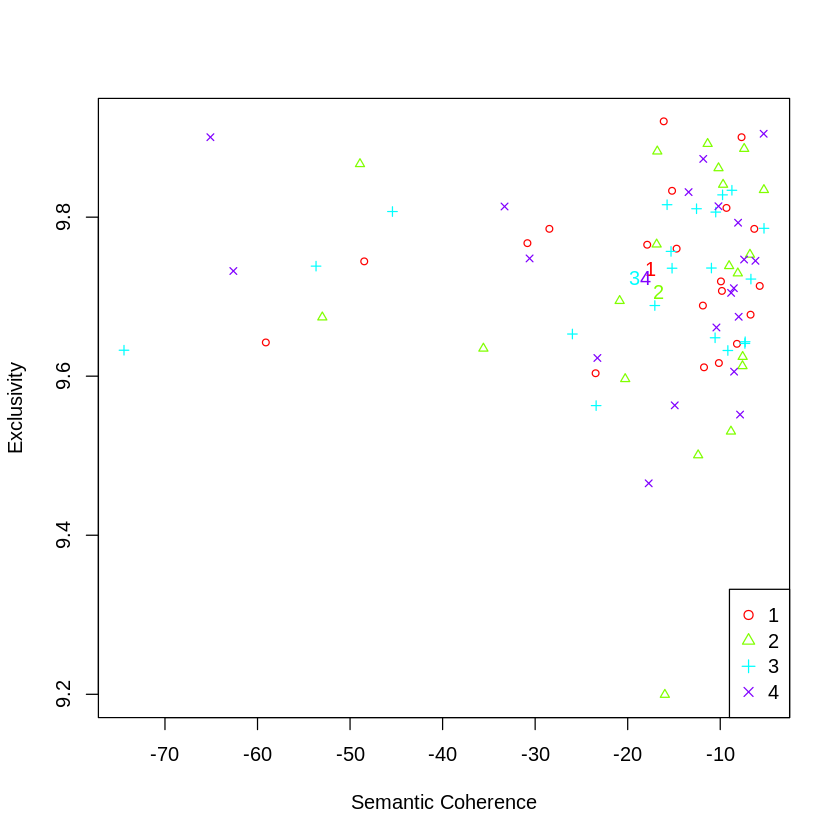

In [41]:
# Model search across numbers of topics

plotModels(charterSelect, pch=c(1,2,3,4), legend.position="bottomright")

In [63]:
selectedmodel <- charterSelect$runout[[3]]

ERROR: Error in eval(expr, envir, enclos): object 'charterSelect' not found


### 5. Understand: Interpreting the STM by plotting and inspecting results

In [ ]:
# Understanding topics through words and example documents
# Explore the words associated with each topic

labelTopics(charterPrevFit, c(3, 7, 20))

In [ ]:
# examine documents that are highly associated with topics

thoughts3 <- findThoughts(charterPrevFit, texts = shortdoc, n = 2, topics = 3)$docs[[1]]

In [ ]:
thoughts20 <- findThoughts(charterPrevFit, texts = shortdoc, n = 2, topics = 20)$docs[[1]]

In [ ]:
# Estimating metadata/topic relationships

par(mfrow = c(1, 2),mar = c(.5, .5, 1, .5))

In [ ]:
plotQuote(thoughts3, width = 30, main = "Topic 3")

In [ ]:
plotQuote(thoughts20, width = 30, main = "Topic 20")

In [ ]:
out$meta$rating <- as.factor(out$meta$rating)

In [ ]:
prep <- estimateEffect(1:20 ~ rating + s(day), charterPrevFit, meta = out$meta, uncertainty = "Global")

In [ ]:
summary(prep, topics=1)

### 6. Visualize: Presenting STM results

In [ ]:
# Summary visualization

plot(charterPrevFit, type = "summary", xlim = c(0, .3))
# Graphical display of estimated topic proportions.

In [ ]:
# Topical content

plot(prep, covariate = "rating", topics = c(3, 7, 20),model = charterPrevFit, 
        method = "difference",cov.value1 = "Liberal", cov.value2 = "Conservative",
        xlab = "More Conservative ... More Liberal", main = "Effect of Liberal vs. Conservative",
        xlim = c(-.1, .1), labeltype = "custom", custom.labels = c('Obama', 'Sarah Palin','Bush Presidency'))

In [ ]:
plot(prep, "day", method = "continuous", topics = 7, model = z, printlegend = FALSE, xaxt = "n", xlab = "Time (2008)")

In [ ]:
monthseq <- seq(from = as.Date("2008-01-01"),to = as.Date("2008-12-01"), by = "month")

In [ ]:
monthnames <- months(monthseq)
axis(1,at = as.numeric(monthseq) - min(as.numeric(monthseq)),labels = monthnames)

# Graphical display of topic prevalence.

In [ ]:
charterContent <- stm(out$documents, out$vocab, K = 20,prevalence =~ poor_students + s(students_ofcolor), content =~ poor_students, max.em.its = 75, data = out$meta, init.type = "Spectral")

In [ ]:
plot(charterContent, type = "perspectives", topics = 11)

# Graphical display of topical perspectives

In [ ]:
plot(charterPrevFit, type = "perspectives", topics = c(12, 20))

# Graphical display of topical contrast between topics 12 and 20.

In [ ]:
# Plotting covariate interactions